In [1]:
import __casac__ as cc
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astropy.io import fits as pf
from dsacalib.utils import *
from dsacalib.calib import * 
from dsacalib.plotting import *
%matplotlib inline

In [2]:
# Define the file, source and pointing parameters
datadir= '/home/simard/dsa_calib/data'
fl     = '{0}/J1459+7140/flagged.fits'.format(datadir) 
cal    = src('J1459+7140',7.47,'14h59m07.63s','+71d40m19.9s')
sr0    = src('J1520+7225',1.5491,'15h20m47.46s','+72d25m04.80s')
antenna_order = [8,5,7,4,3,0,9,1,6,2]
nant   = len(antenna_order)

## Find calibration solutions using calibrator

In [3]:
fobs, blen, bname, tstart, tstop, vis, mjd, transit_idx = \
    read_psrfits_file(fl,cal,dur=50*u.min,
                      antpos='{0}/antpos_ITRF.txt'
                      .format(datadir))

File covers 1.01 h hours from MJD 58753.925137845064 to 58753.96714612979


In [4]:
vis = vis/visibility_model(blen,[cal],mjd,fobs)[...,np.newaxis]

#### Write 10-s fringe-stopped visibilities to ms

In [5]:
convert_to_ms(cal,vis,tstart,'{0}.ms'.format(cal.name),bname,
             antpos='{0}/antpos_ITRF.txt'.format(datadir))
ms = cc.ms.ms()
ms.open('{0}.ms'.format(cal.name))
times = ms.getdata(["time"])['time']
ms.close()

In [6]:
ms = cc.ms.ms()
ms.open('{0}.ms'.format(cal.name))
times = ms.getdata(["time"])['time']
ms.close()

True

In [13]:
try:
    convert_to_ms(cal,vis,tstart,'{0}.ms'.format(cal.name),bname,
             antpos='{0}/antpos_ITRF.txt'.format(datadir),dt=0)
except AssertionError:
    pass
ms = cc.ms.ms()
ms.open('{0}.ms'.format(cal.name))
times2 = ms.getdata(["time"])['time']
ms.close()

True

In [15]:
print(times2-times)

[37.00000095 37.00000095 37.00000095 ... 37.00000095 37.00000095
 37.00000095]


#### Delay calibration

In [6]:
delay_calibration('{0}'.format(cal.name),prefix=cal.name)

#### Use deviations from average delay calibration to flag bad times

In [7]:
bad_times,times = get_bad_times(cal,nant)
flag_badtimes('{0}'.format(cal.name),times,bad_times,nant)

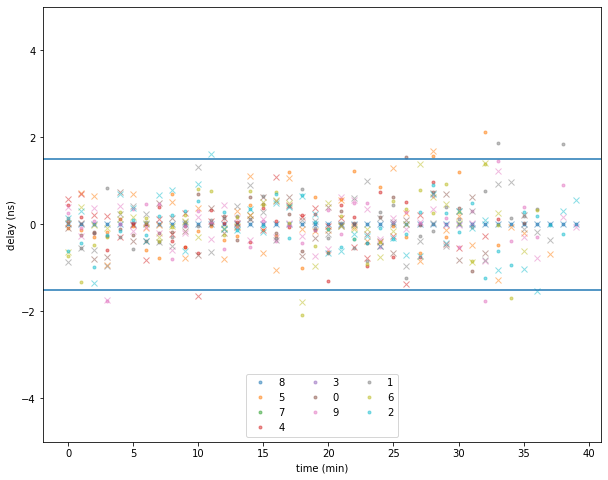

In [8]:
times, antenna_delays, kcorr = plot_antenna_delays(cal,antenna_order)

#### Flag antennas that we know are bad and short baselines with crosstalk

In [9]:
flag_antenna('{0}'.format(cal.name),4)
flag_antenna('{0}'.format(cal.name),2)
flag_antenna('{0}'.format(cal.name),"3,5,7,9&")

#### Gain calibration

In [10]:
gain_calibration(cal)

#### Look at solutions

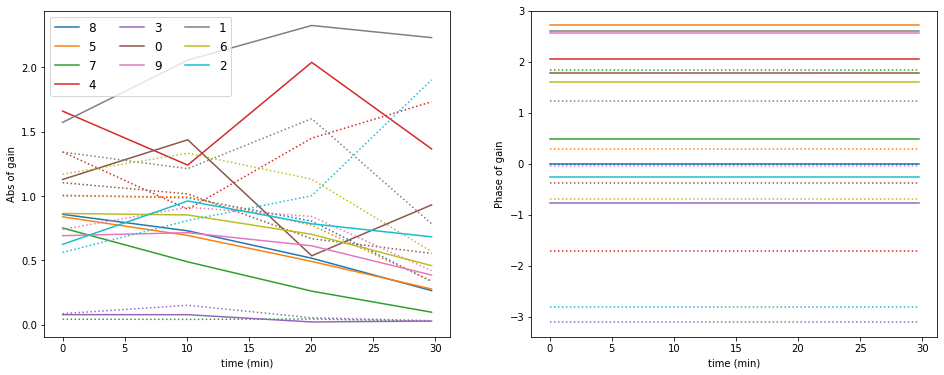

In [11]:
plot_gain_calibration(cal,antenna_order)

Image shape: [256 256   1   1]
Peak SNR at pix (130,129) = 5.131438773355768
Value at peak: 1.0538740158081055
Value at origin: 1.0453178882598877
1 errors occured during imaging


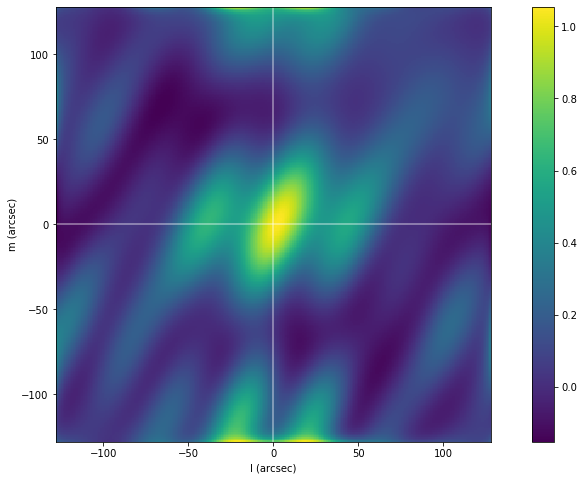

In [12]:
plot_image('{0}'.format(cal.name),'corrected',cal,verbose=True)

## Apply solution to target source

In [13]:
fobs, blen, bname, tstart, tstop, vis, mjd, transit_idx = \
    read_psrfits_file(fl,sr0,dur=5*u.min,
                      antpos='{0}/antpos_ITRF.txt'
                      .format(datadir))

File covers 1.01 h hours from MJD 58753.925137845064 to 58753.96714612979


In [14]:
vis = vis/visibility_model(blen,[sr0],mjd,fobs,phase_only=True)[...,np.newaxis]

In [24]:
convert_to_ms(sr0,vis,mjd[0],'{0}.ms'.format(sr0.name),bname,
             antpos='{0}/antpos_ITRF.txt'.format(datadir))

#### Flag bad antennas and short baselines

In [16]:
flag_antenna('{0}'.format(sr0.name),4)
flag_antenna('{0}'.format(sr0.name),2)
flag_antenna('{0}'.format(sr0.name),"3,5,7,9&")

#### Calibrate

In [17]:
apply_calibration(sr0,cal)

#### Look at calibrated data

In [18]:
ms = cc.ms.ms()
ms.open('{0}.ms'.format(sr0.name))
data = ms.getdata(['corrected_data'])
vis_cal = data['corrected_data'].reshape(2,625,-1,45).T
ms.close()
mjd = np.mean(mjd[:25])+np.arange(vis_cal.shape[1])*np.median(np.diff(mjd))*25

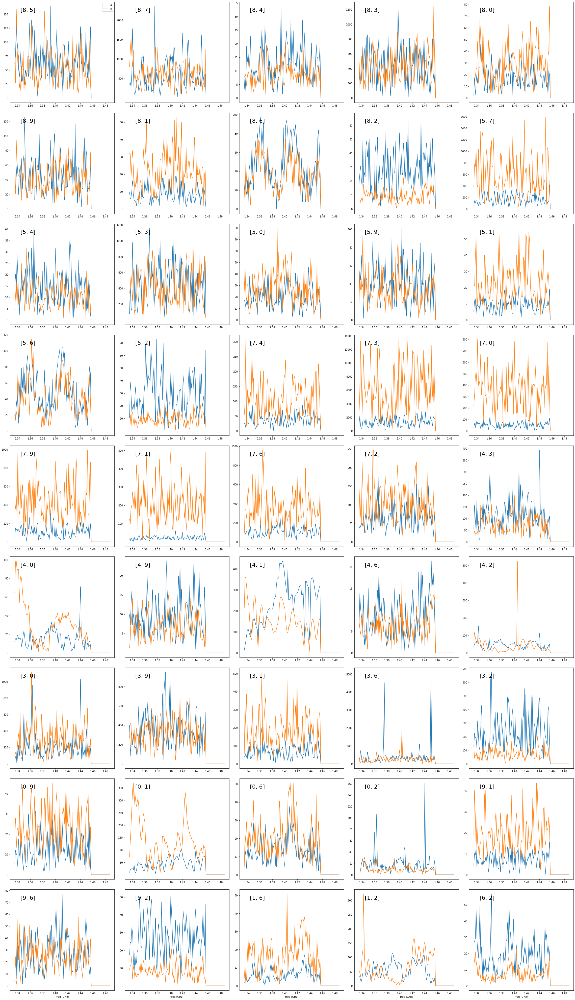

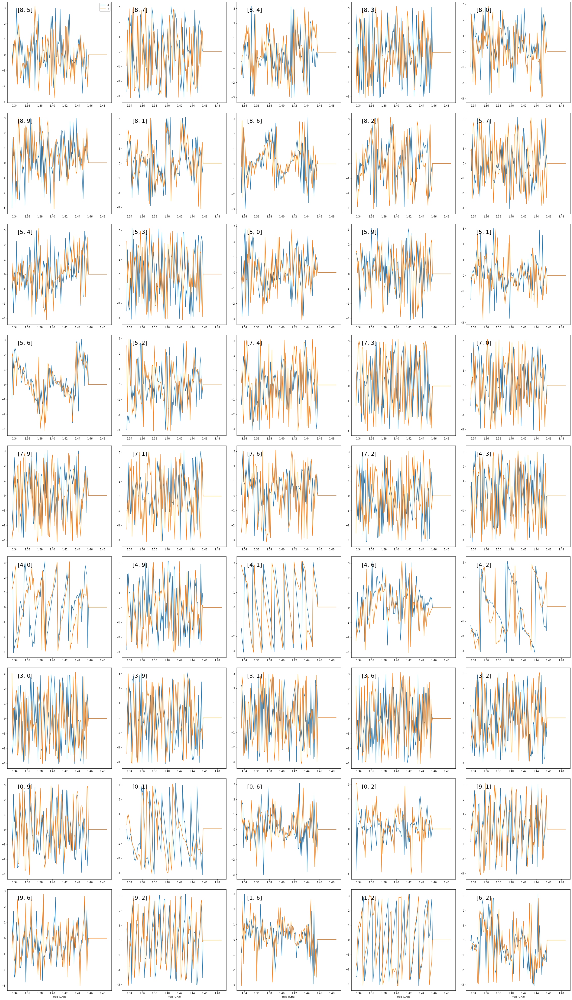

In [19]:
plot_vis_freq(vis_cal,fobs,bname)

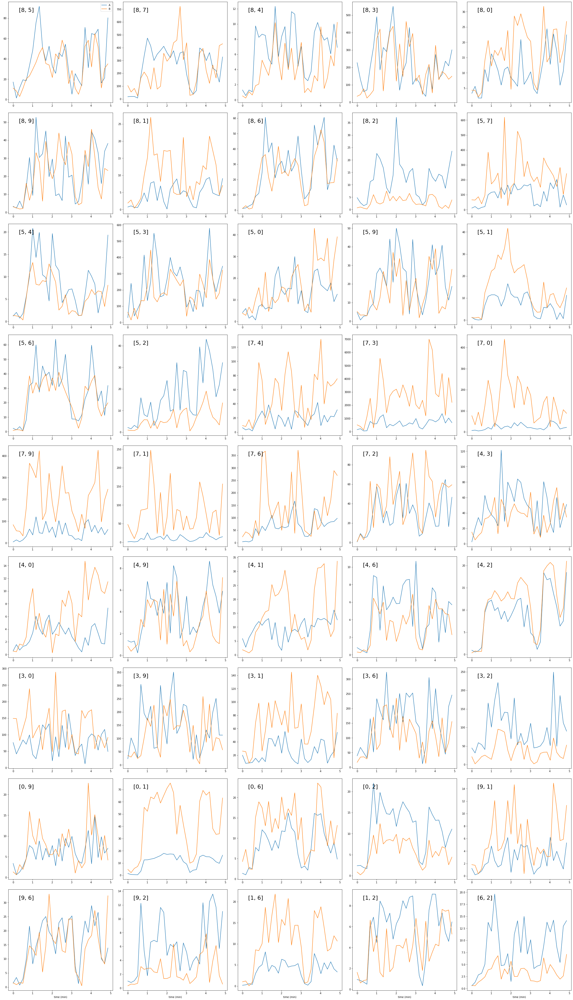

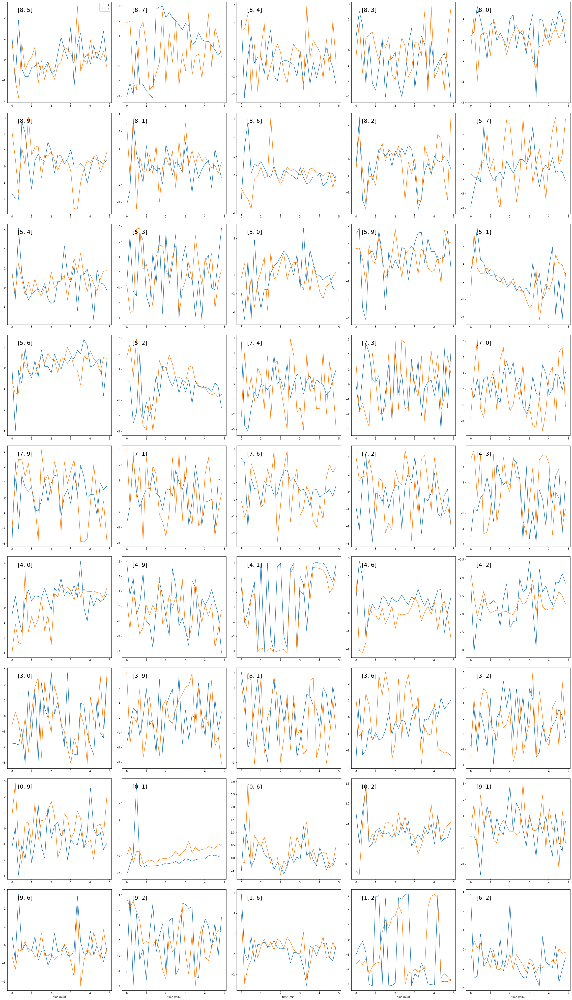

In [20]:
plot_vis_time(vis_cal,mjd,bname)

Image shape: [128 128   1   1]
Peak SNR at pix (61,67) = 3.2488679436903847
Value at peak: 9.863508224487305
Value at origin: 9.564919471740723
1 errors occured during imaging


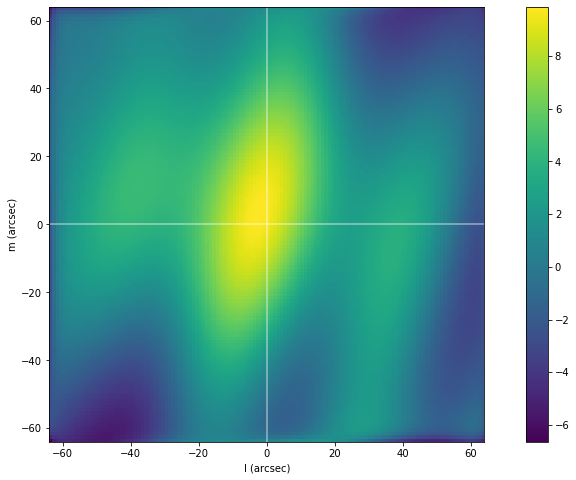

In [21]:
plot_image('{0}'.format(sr0.name),'corrected',sr0,verbose=True,
          npix=128)

Image shape: [256 256   1   1]
Peak SNR at pix (144,0) = 4.22059197079546
Value at peak: 13.706463813781738
Value at origin: 9.564661979675293
1 errors occured during imaging


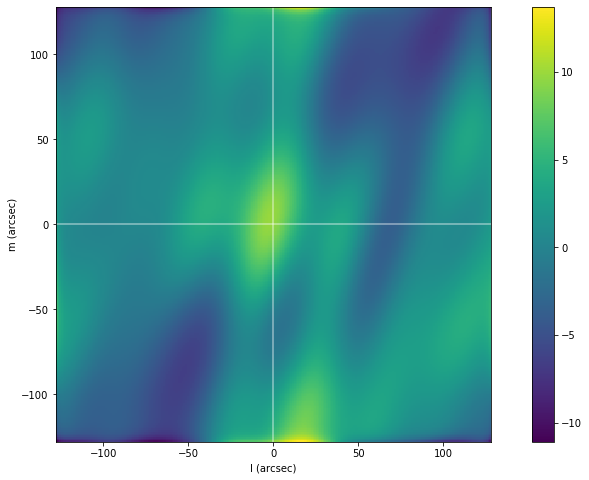

In [22]:
plot_image('{0}'.format(sr0.name),'corrected',sr0,verbose=True)